**NOTE : DUMP LOAD MODEL USING JOBLIB AND PICKLE AT THE END**

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

In [2]:
df = pd.read_csv("homeprices.csv")
df

,area,price
0,2600,550000
1,3000,565000
2,3200,610000


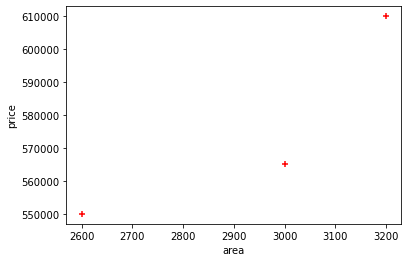

In [3]:
%matplotlib inline
plt.xlabel('area')
plt.ylabel('price')
plt.scatter(df.area,df.price,color= 'red',marker = '+')

In [4]:
model = LinearRegression()

In [5]:
type(df.area)

pandas.core.series.Series

In [6]:
type(df.price)

pandas.core.series.Series

In [7]:
type(df['area']) #series

pandas.core.series.Series

In [8]:
type(df[['area']]) #dataframe

pandas.core.frame.DataFrame

In [9]:
# model.fit(df.area,df.price) #this will throw an error
# fit function accepts (dataframe/2darray,series/singlecolumn)

In [10]:
model.fit(df[['area']],df.price)

LinearRegression()

In [11]:
model.coef_ #value of m in y= mx +b (handcalculations shown below)

array([91.07142857])

In [12]:
model.intercept_ #value of b in y = mx+b (handcalculations shown below)

307857.1428571429

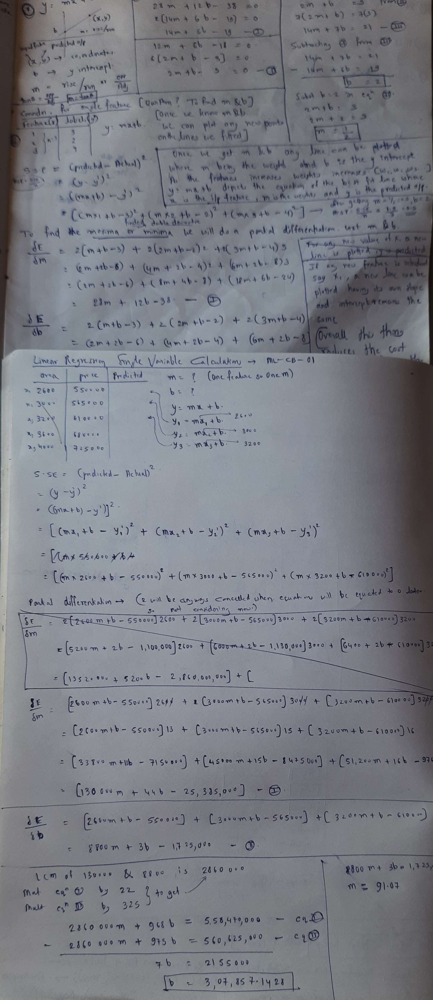

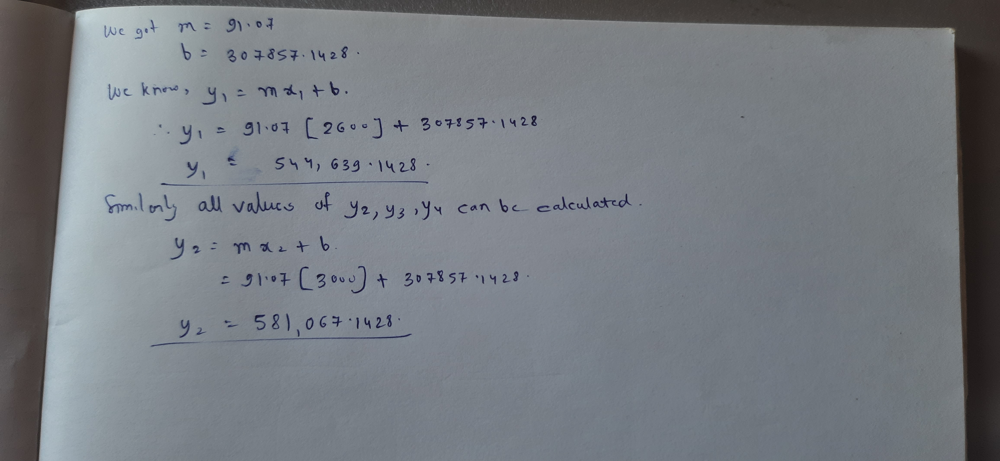

In [13]:
model.predict([[3300]]) #accepts dataframe only(2d array)

C:\Users\DELL\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


array([608392.85714286])

In [14]:
model.predict([[3300]])[0] #to access the returned value

C:\Users\DELL\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


608392.8571428572

In [15]:
model.predict(df[['area']]) #handcalculations done and verified above

array([544642.85714286, 581071.42857143, 599285.71428571])

In [16]:
#proof?
# y = mx + b
# 135.78767123 * 3300 + 180616.43835616432
91.07142857 * 3300 + 307857.1428571429

608392.8571381429

In [17]:
d = pd.read_excel('areas.xlsx') #reading new file of test values
d

,area
0,4022
1,5627
2,2334
3,6589
4,3250
5,7063
6,7935
7,4702
8,6801
9,4503


In [18]:
model.predict(d)

array([ 674146.42857143,  820316.07142857,  520417.85714286,
        907926.78571429,  603839.28571429,  951094.64285714,
       1030508.92857143,  736075.        ,  927233.92857143,
        717951.78571429,  635532.14285714])

In [19]:
p = model.predict(d) #Assigning variable

In [20]:
d['prices']= p #Appending/creating a column with prices

In [21]:
d

,area,prices
0,4022,6.741464e+05
1,5627,8.203161e+05
2,2334,5.204179e+05
3,6589,9.079268e+05
4,3250,6.038393e+05
5,7063,9.510946e+05
6,7935,1.030509e+06
7,4702,7.360750e+05
8,6801,9.272339e+05
9,4503,7.179518e+05


In [22]:
d.to_csv("predictions.csv",index = False) #saves to a new csv file. Index column is not created.

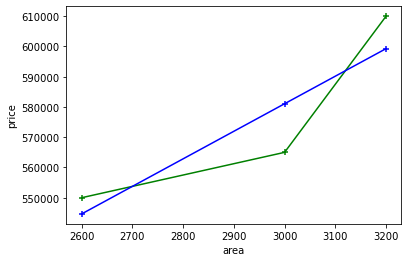

In [23]:
%matplotlib inline
plt.xlabel('area')
plt.ylabel('price')

plt.scatter(df.area,df.price,color= 'green',marker = '+') #marker : area vs price (train)
plt.plot(df.area,df.price,color= 'green') #plots line: area vs price (train)

plt.scatter(df.area,model.predict(df[['area']]),color= 'blue',marker = '+') #plots markers:area vs predicted price (training area)
plt.plot(df.area,model.predict(df[['area']]),color= 'blue') # plots line: area vs predicted price (training area)

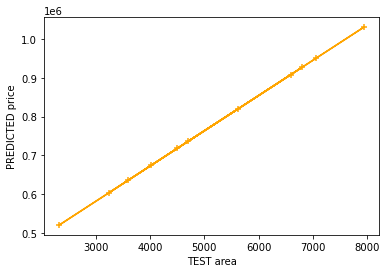

In [24]:
%matplotlib inline
plt.xlabel('TEST area')
plt.ylabel('PREDICTED price')
plt.scatter(d.area,d.prices,color= 'orange',marker = '+') #test predicted scatter
plt.plot(d.area,d.prices,color= 'orange') # test predicted regression line 

**PICKLE : Dumping and Loading from saved Model**

In [39]:
import pickle

In [40]:
with open ('saved_pickle_model','wb') as f:
    pickle.dump(model,f)

In [41]:
with open ('saved_pickle_model','rb') as f:
    pickle_model = pickle.load(f)

In [42]:
pickle_model.predict([[4200]]) #predicting with imported model

C:\Users\DELL\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


array([690357.14285714])

In [43]:
model.predict([[4200]]) #predicting with original model

C:\Users\DELL\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


array([690357.14285714])

**JOBLIB : Dumping and Loading from saved Model**

In [47]:
import joblib

In [48]:
joblib.dump(model,'saved_joblib_model')

['saved_joblib_model']

In [49]:
joblib_model= joblib.load('saved_joblib_model')

In [50]:
joblib_model.predict([[4200]])

C:\Users\DELL\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


array([690357.14285714])